# SF Crime Data Exploration & Analysis
* Author: Kevin Chuang [@k-chuang](https://www.github.com/k-chuang)
* Created on: March 21, 2018
* Description: Data analysis, exploration & visualization on crime incidents in SF
* Curated dataset: [SF Crime dataset](https://data.sfgov.org/Public-Safety/-Change-Notice-Police-Department-Incidents/tmnf-yvry/about)
* Kaggle dataset: [SF Crime Kaggle dataset](https://www.kaggle.com/c/sf-crime/data)

---------------

## SF Crime Dataset

This dataset contains incidents derived from SFPD Crime Incident Reporting system. The data ranges from 1/1/2003 to 5/13/2015. The training set and test set rotate every week, meaning week 1,3,5,7... belong to test set, week 2,4,6,8 belong to training set. The goal is to try to predict the category of crime that occurred in the city of San Francisco. 

### Data Fields
- **Dates** - timestamp of the crime incident
- **Category** - category of the crime incident (only in train.csv). This is the target variable you are going to predict.
- **Descript** - detailed description of the crime incident (only in train.csv)
- **DayOfWeek** - the day of the week
- **PdDistrict** - name of the Police Department District
- **Resolution** - how the crime incident was resolved (only in train.csv)
- **Address** - the approximate street address of the crime incident 
- **X** - Longitude
- **Y** - Latitude

In [1]:
# Import necessary packages
import pandas as pd
import numpy as np
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

%matplotlib inline

# Set pandas's max row display
pd.set_option('display.max_row', 1000)

# Set pandas's max column width to 50
pd.set_option('display.max_columns', 50)

# Set Seaborn style to default
sns.set_style('darkgrid')

In [2]:
# Load in just the training set
df = pd.read_csv('train.csv')

## Data Exploration + Data Visualization

### View Subset of Data

In [3]:
## Print first 5 lines of dataset
df.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [4]:
# Set target feature of interest
crime_categories = df['Category'].value_counts()
crime_category_names = crime_categories.index

### What categories of crimes are most prevalent in SF between 2003 - 2015?

- 39 Crime Categories
- We notice that the target feature `Category` is very imbalanced with most of the occurences (around 60%) in the top 5 categories

In [5]:
## Check if any rows are missing data and are null## Chec 
df['Category'].isnull().values.any()

False

In [6]:
## Count number of observations for each crime
df['Category'].value_counts()

LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQUOR LAWS 

So, you can see that Larceny/Theft has the most occurrences.

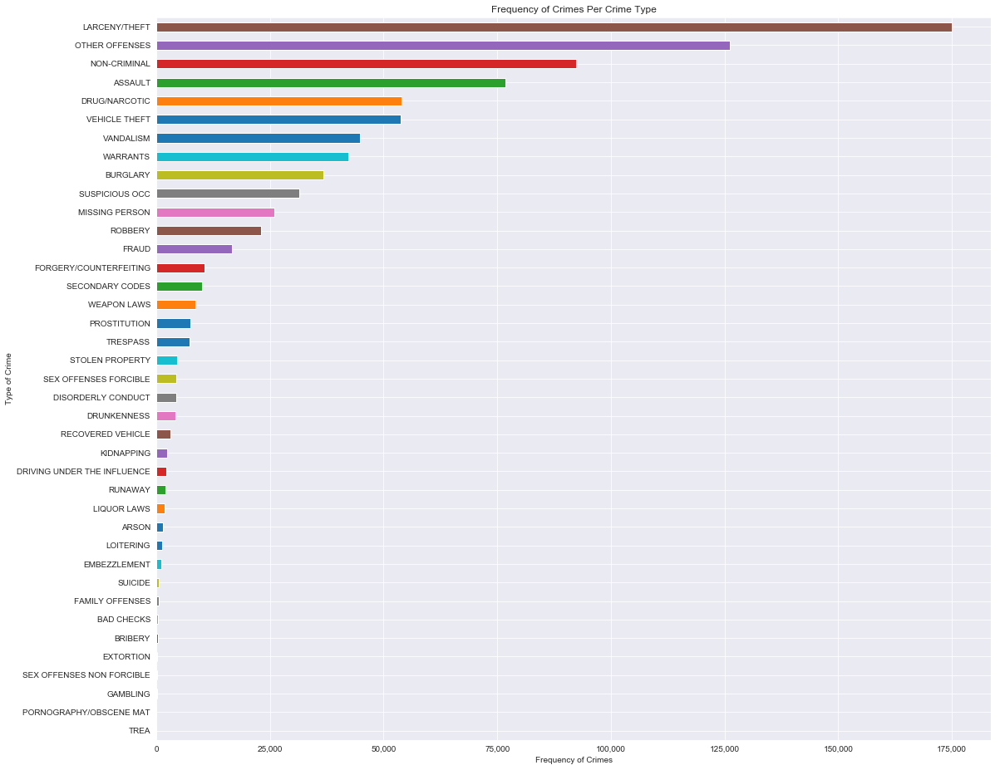

In [7]:
## Plot these for better visualization
crime_type_df = df['Category'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(18, 16))
plt.title("Frequency of Crimes Per Crime Type")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Type of Crime")
ax = crime_type_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

## Time Features

- Time features: Hour, Month, Year, DayofWeek
- plot line plot for each of these
- plot a distribution (histogram) for each of these

In [8]:
df["Dates"] = pd.to_datetime(df["Dates"], format="%Y-%m-%d %H:%M:%S")
df["Hour"] = df["Dates"].map(lambda x: x.hour)
df["Month"] = df["Dates"].map(lambda x: x.month)
df["Year"] = df["Dates"].map(lambda x: x.year)

In [9]:
# Let's define a function to plot the distributions of categories of crime based on different temporal features

def plot_temporal_feature(df, time_feature, crime_category_names, xaxis_formatter=None, xtick_inc=None):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
        sns.lineplot(data=temporal_data)
        if xtick_inc:
            plt.xticks(np.arange(df[time_feature].unique().min(),df[time_feature].unique().max()+1, xtick_inc))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 13)
        if xaxis_formatter:
            p.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))
    #     p.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
        plt.ylabel("Frequency of Crime", fontsize=25)
        time_feature_str = str(time_feature).capitalize()
        plt.xlabel(time_feature_str, fontsize=25)
        plt.title("%s (%s)" % (crime, 'per '+ time_feature_str), fontsize=30)
    
    fig.savefig('visualizations/%s.png' % time_feature_str, bbox_inches='tight')

### Distribution of Crime over 24 hours

- First plot all crimes over 24 hours
- Then plot per category over 24 hours

In [10]:
def convert_time(hour):
    d = datetime.strptime(str(hour), "%H")
    return d.strftime("%I:%M %p")


In [11]:
## Group dataset by crime occurences and time

# crime_per_time = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.hour.value_counts().sort_index()
crime_per_time = df["Hour"].value_counts().sort_index()
crime_per_time

0     44865
1     26173
2     22296
3     14014
4      9863
5      8637
6     13133
7     22048
8     32900
9     35555
10    37806
11    38373
12    51934
13    43145
14    44424
15    48058
16    50137
17    53553
18    55104
19    49475
20    44694
21    43661
22    45741
23    42460
Name: Hour, dtype: int64

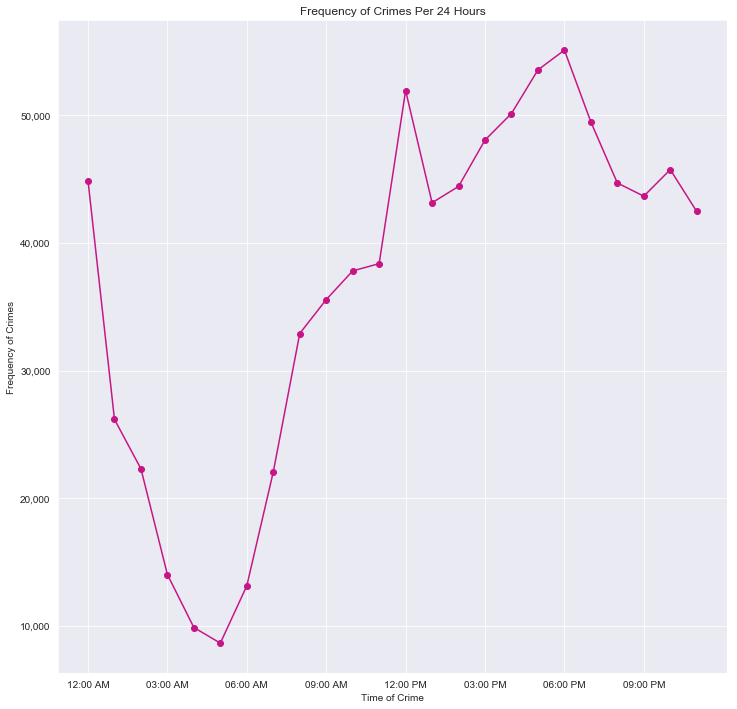

In [12]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per 24 Hours")
plt.xlabel("Time of Crime")
plt.ylabel("Frequency of Crimes")

ax = crime_per_time.plot(grid=True, marker='o', color='mediumvioletred')

ax.set_xticks(crime_per_time.index[::3])

ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_time(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

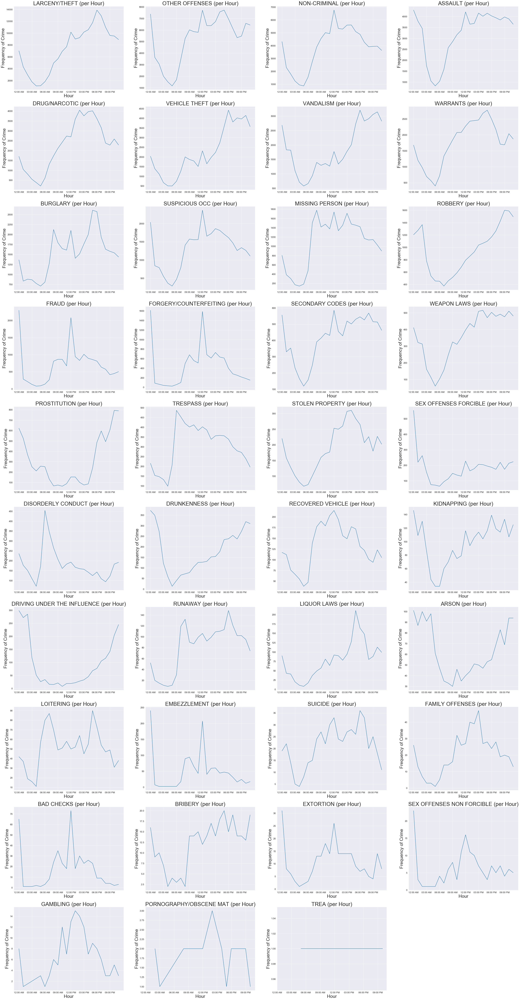

In [13]:
plot_temporal_feature(df, 'Hour', crime_category_names, convert_time, xtick_inc=3)

### Distribution of Crime per Month

In [14]:
# crime_per_month = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.month.value_counts().sort_index()
crime_per_month = df['Month'].value_counts().sort_index()
crime_per_month

1     73536
2     70813
3     76320
4     78096
5     79644
6     70892
7     69971
8     68540
9     71982
10    80274
11    72975
12    65006
Name: Month, dtype: int64

In [15]:
# Used to convert month numbers to month names
import calendar

def convert_month(num):
    return calendar.month_abbr[num]
    

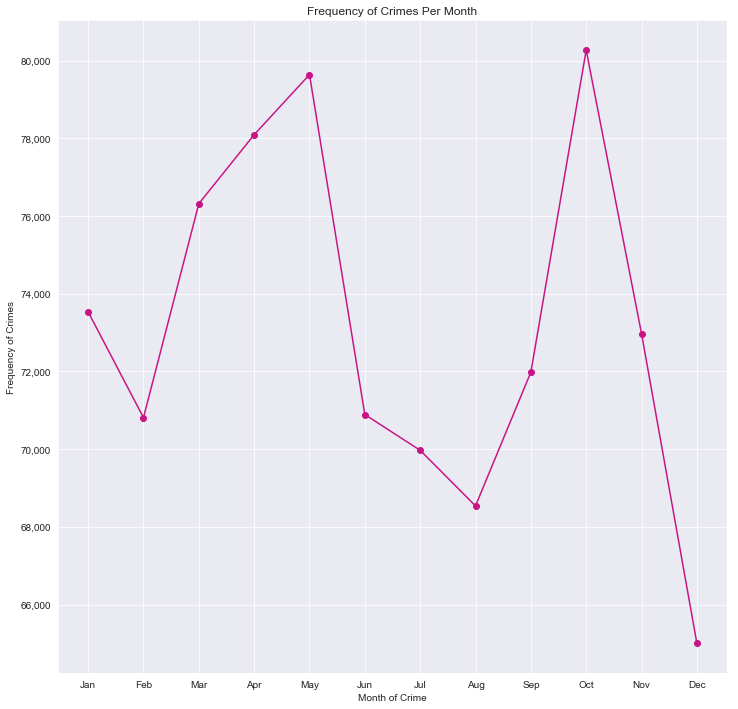

In [16]:
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Month")
plt.xlabel("Month of Crime")
plt.ylabel("Frequency of Crimes")

ax = crime_per_month.plot(grid=True, marker='o', color='mediumvioletred')

ax.set_xticks(crime_per_month.index)

ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_month(x)))

ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

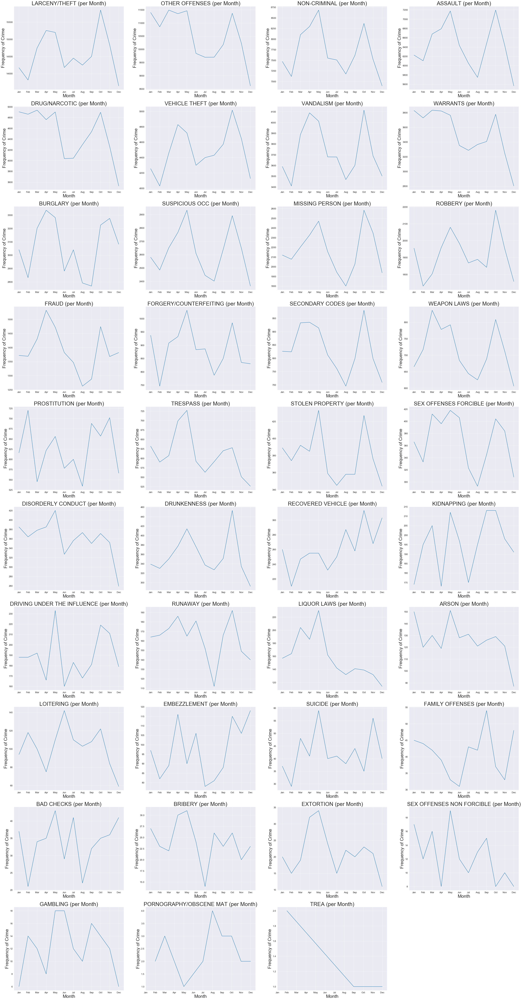

In [17]:
plot_temporal_feature(df, 'Month', crime_category_names, convert_month, xtick_inc=1)


### Distribution of Crimes per day of week

In [18]:
## Used to order the categories
df['DayOfWeek'] = pd.Categorical(df['DayOfWeek'], 
                                 categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], 
                                 ordered=True)


crime_per_day = df['DayOfWeek'].value_counts().sort_index()
crime_per_day.index.values

[Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, Sunday]
Categories (7, object): [Monday < Tuesday < Wednesday < Thursday < Friday < Saturday < Sunday]

In [19]:
crime_per_day

Monday       121584
Tuesday      124965
Wednesday    129211
Thursday     125038
Friday       133734
Saturday     126810
Sunday       116707
Name: DayOfWeek, dtype: int64

[Text(0,0,'Monday'),
 Text(0,0,'Tuesday'),
 Text(0,0,'Wednesday'),
 Text(0,0,'Thursday'),
 Text(0,0,'Friday'),
 Text(0,0,'Saturday'),
 Text(0,0,'Sunday')]

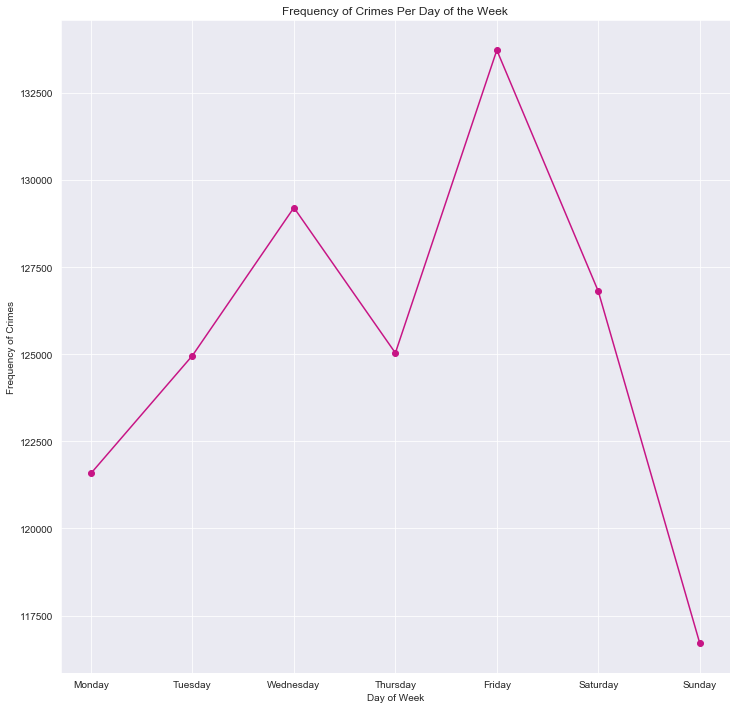

In [20]:
fig = plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Day of the Week")
plt.xlabel("Day of Week")
plt.ylabel("Frequency of Crimes")

# ax = crime_per_day.plot(kind='barh')
ax = crime_per_day.plot(grid=True, marker='o', color='mediumvioletred')

# Quick Note for string X tick labels:
# .set_xticks() on the axes will set the locations and set_xticklabels() will set the displayed text.
ax.set_xticks([0, 1, 2, 3, 4, 5, 6])
ax.set_xticklabels(crime_per_day.index)

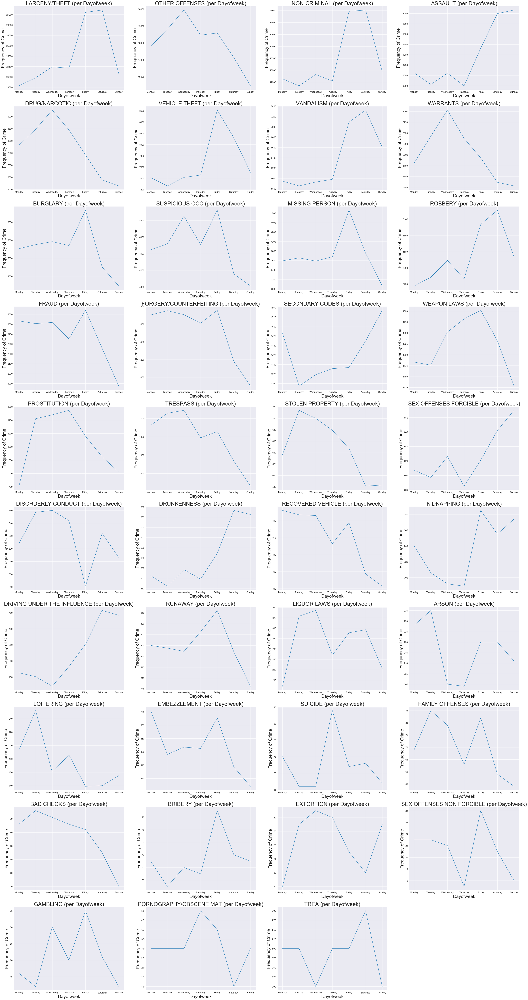

In [21]:
plot_temporal_feature(df, 'DayOfWeek', crime_category_names, None, None)

### Distribution of Crimes per Year

In [22]:
crime_per_year = df["Year"].value_counts().sort_index()
crime_per_year

2003    73902
2004    73422
2005    70779
2006    69909
2007    68015
2008    70174
2009    69000
2010    66542
2011    66619
2012    71731
2013    75606
2014    74766
2015    27584
Name: Year, dtype: int64

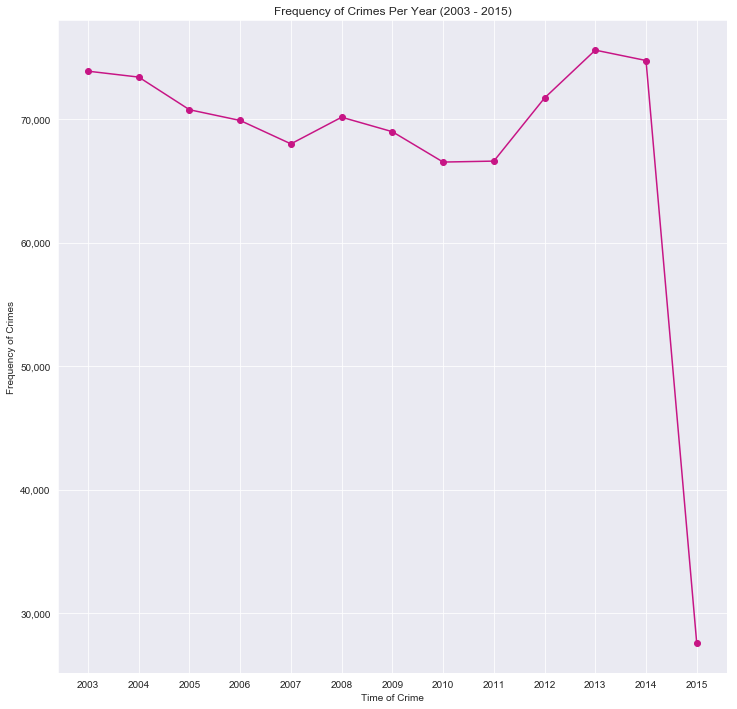

In [23]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Year (2003 - 2015)")
plt.xlabel("Time of Crime")
plt.ylabel("Frequency of Crimes")


ax = crime_per_year.plot(grid=True, marker='o', color='mediumvioletred')

ax.set_xticks(crime_per_year.index)

ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

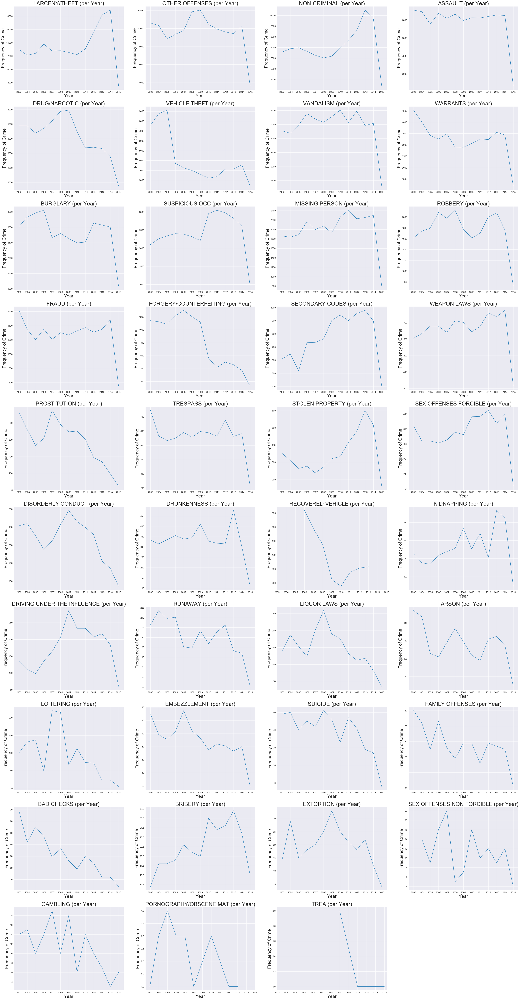

In [24]:
plot_temporal_feature(df, 'Year', crime_category_names, None, xtick_inc=1)

## Histogram Plots

- plot distributions of each crime using histograms and seaborn's `FacetGrid`

In [25]:
# Set up some seaborn parameters
sns.set(font_scale=2.5)

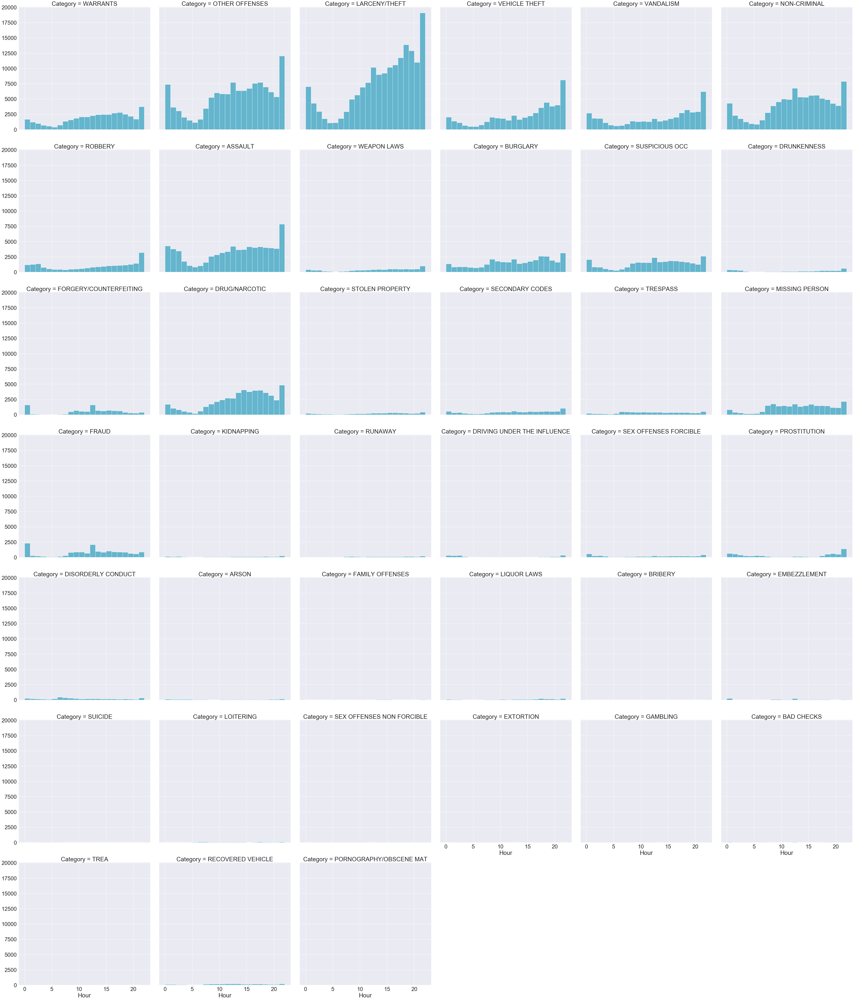

In [26]:
g = sns.FacetGrid(df, col="Category", col_wrap=6, height=10)
g = g.map(plt.hist, "Hour", bins=np.arange(0, 23), color="c")

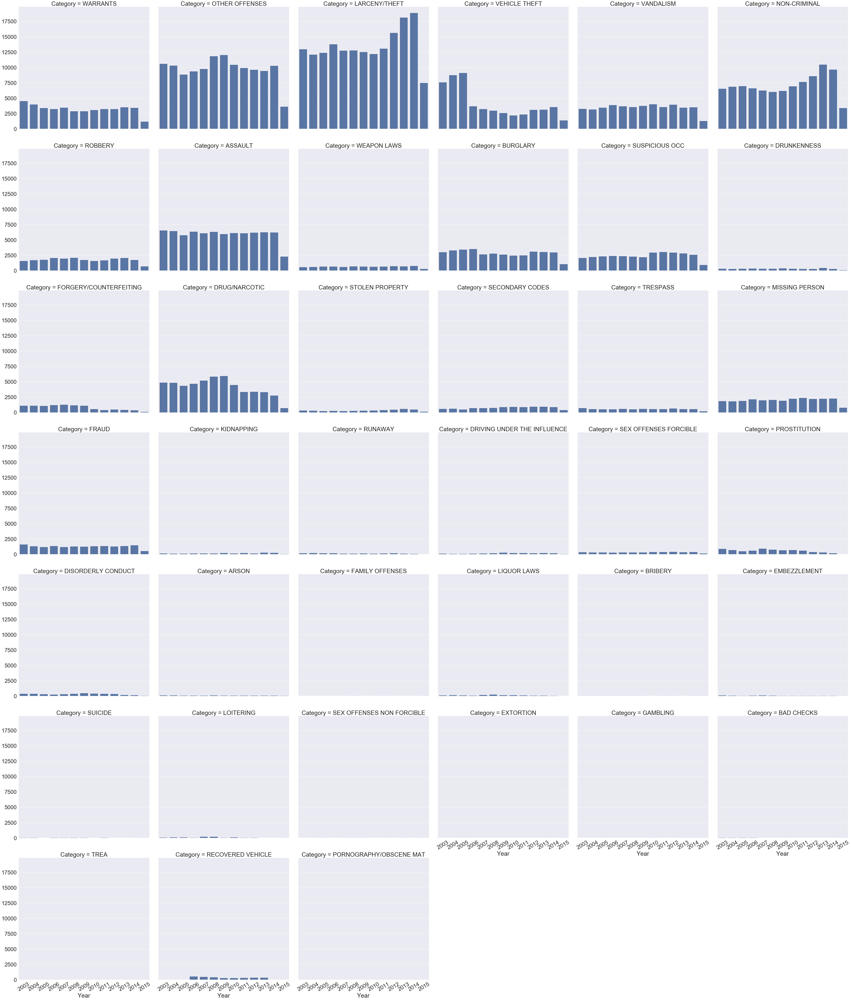

In [27]:
g = sns.FacetGrid(df, col="Category", col_wrap=6, height=10)
g = g.map(sns.countplot, "Year", order=np.sort(df['Year'].unique()))
g.set_xticklabels(rotation=30)

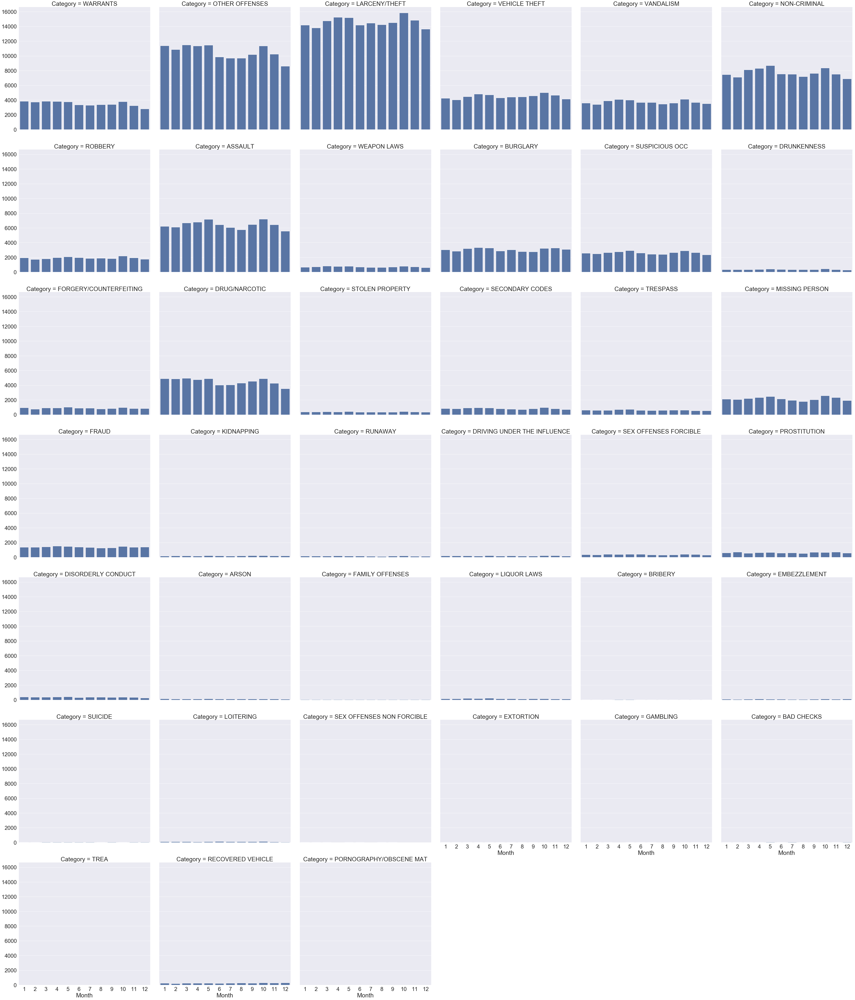

In [28]:
g = sns.FacetGrid(df, col="Category", col_wrap=6, height=10)
g = g.map(sns.countplot, "Month", order=np.sort(df['Month'].unique()))

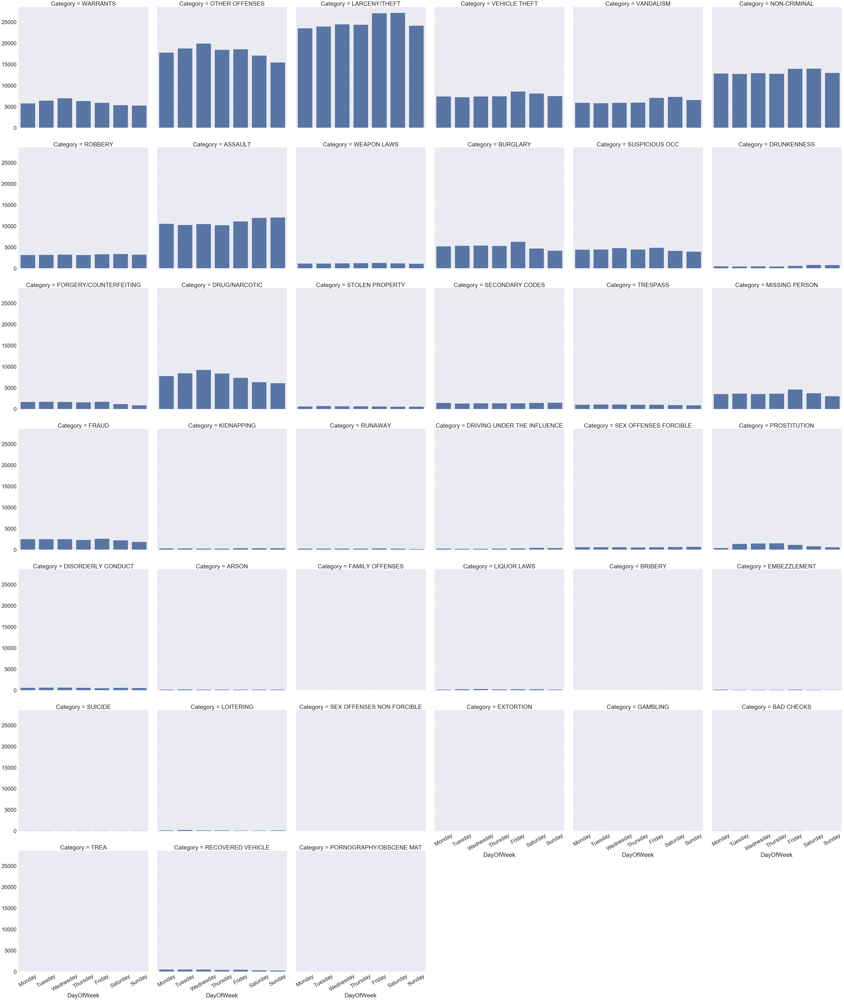

In [29]:
g = sns.FacetGrid(df, col="Category", col_wrap=6, height=10)
g = g.map(sns.countplot, "DayOfWeek", order=df['DayOfWeek'].sort_values().unique())
g.set_xticklabels(rotation=30)

# Spatial Features

In [30]:
def plot_long_lat_map(df, crime_category_names):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        plt.title(crime + " locations")
        p.scatter(cur_crime_data.X, cur_crime_data.Y, alpha = 0.01)
        plt.xlabel("Longitude", fontsize=25)
        plt.ylabel('Latitude', fontsize=25)
#         p.set_xticklabels(rotation=30)
        plt.title("%s %s" % (crime, 'locations'), fontsize=30)
    
    fig.savefig('visualizations/sf_crime_locations_per_category_map.png', bbox_inches='tight')

### Distribution of Crime Per Police District

- plot all crimes with a bar plot
- plot specific categories of crime with a heat plot

In [31]:
crime_per_PD = df['PdDistrict'].value_counts()
crime_per_PD

SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
Name: PdDistrict, dtype: int64

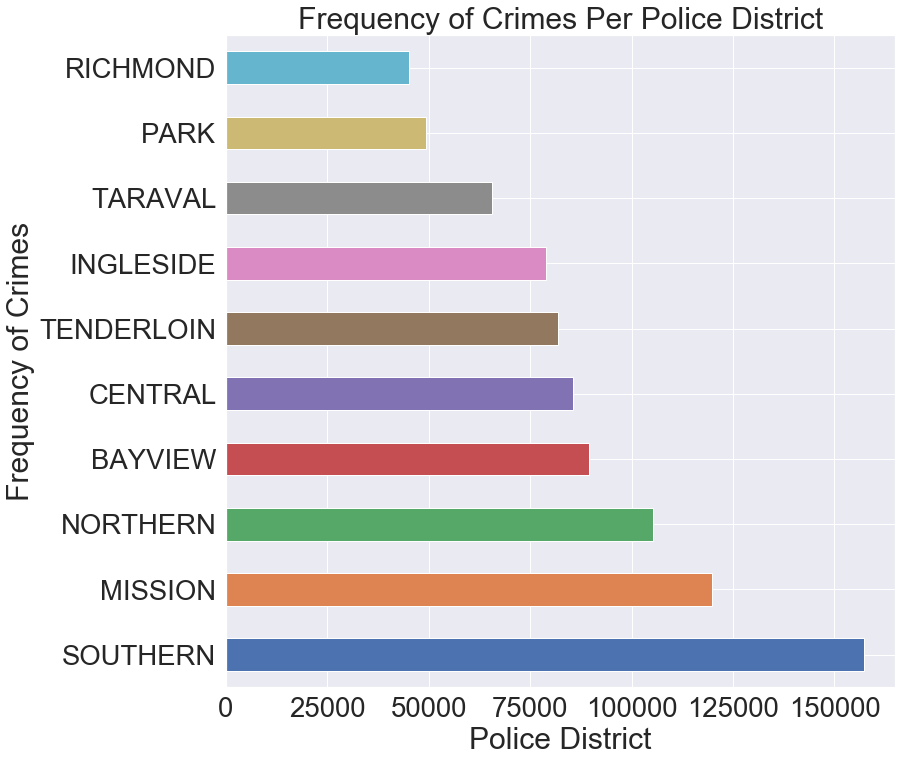

In [32]:
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Police District")
plt.xlabel("Police District")
plt.ylabel("Frequency of Crimes")

ax = crime_per_PD.plot(kind='barh')

fig.savefig('visualizations/PdDistrict_barplot.png', bbox_inches='tight')

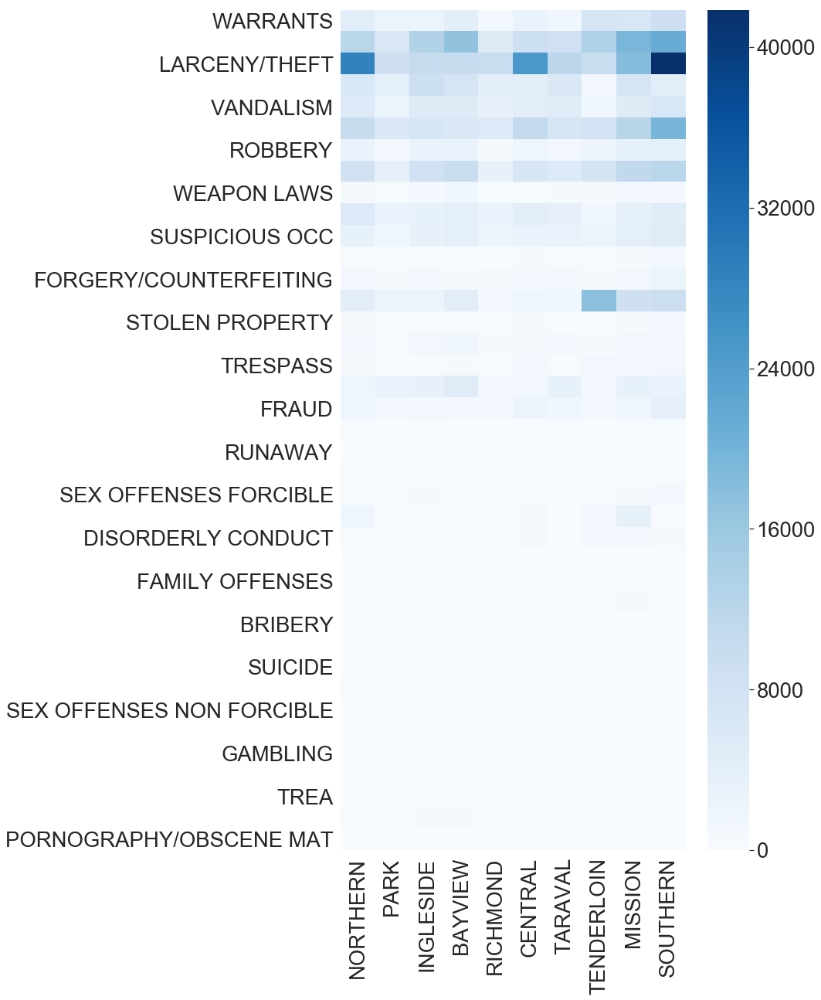

In [33]:
categories = df['Category'].unique()
districts = df['PdDistrict'].unique()
tarray = []
for catgr in categories:
    sub_array = []
    for distr in districts:
        sub_array.append(len(df[(df['PdDistrict'] == distr) & (df['Category'] == catgr)]))
    tarray.append(sub_array)

fig, ax = plt.subplots(1, 1, figsize =(10,20))
heat_df = pd.DataFrame(tarray, index=categories, columns=districts)
sns.heatmap(heat_df, cmap='Blues')

fig.savefig('visualizations/PdDistrict_per_crime_category_heatmap.png', bbox_inches='tight')

## Data Visualization with Maps & Density Plots

### Map Visualization from X & Y coordinates

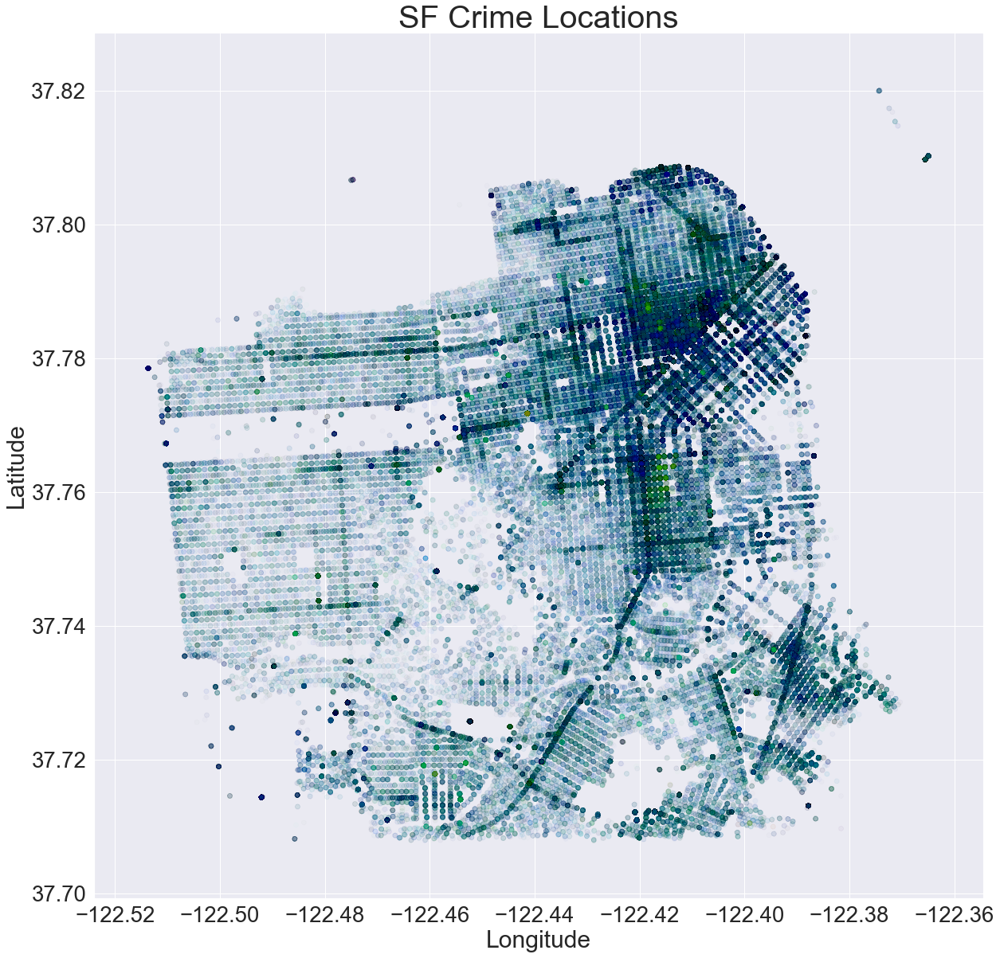

In [34]:
# Let's drop the outlier for now, since it is skewing our visualization
df.drop(df[df['Y'] == df['Y'].max()].index, inplace=True)

# Assign a color index to each crime category
color_map = dict(zip(crime_category_names, range(len(crime_categories))))

# Draw a scatter plot to show the crimes distribution
fig = plt.figure(figsize=(20,20))
plt.scatter(df.X, df.Y, c=df.Category.map(color_map), cmap=plt.cm.gist_ncar, alpha = 0.01)
plt.title("SF Crime Locations", fontsize=40)
plt.xlabel('Longitude', fontsize=30)
plt.ylabel('Latitude', fontsize=30)

fig.savefig('visualizations/sf_crime_locations_map.png', bbox_inches='tight')

In [35]:
# Plot interactive map for visualization
crimes_map = folium.Map(location=[df['Y'].mean(), df['X'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(crimes_map)

for row in df.values[:500]:
    popup = "<br> Crime Type: " + row[1] + "<br> Crime Description: " + row[2] + "<br> Date/Time: " + str(row[0])   + "<br> Address: " + row[6] + "</p>"
    folium.Marker([row[8], row[7]], popup=popup).add_to(marker_cluster)

#crimes_map.save('SF-All-Crimes-Map.html')
crimes_map

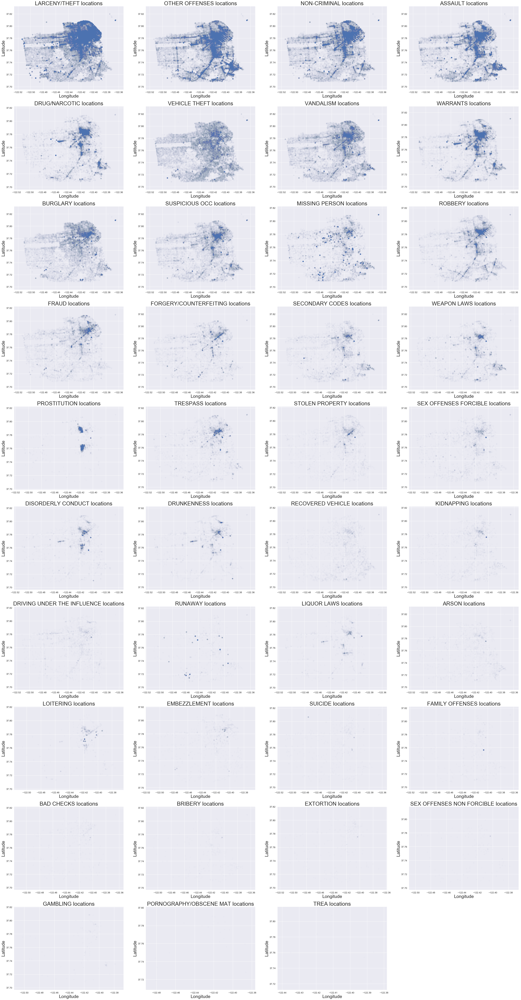

In [36]:
sns.set(font_scale=1.2)
plot_long_lat_map(df, crime_category_names)

# Summary

- Temporal Features
    - Certain categories of crimes have certain occurences temporally
        - based on `Year`, `DayOfWeek`, `Month`, `Hour`
- Spatial Features
    - Certain categories of crime have higher occurences and density in certain areas
        - based on `X` & `Y` (Longitude & Latitude), and `PdDistrict`